#### Steps used:
    
1> Data cleansing and Wrangling
2> Define the metrics for which model is getting optimized.
3> Feature Engineering
4> Data Pre-processing
5> Feature Selection
6> Split the data into training and test data sets.
7> Model Selection
8> Model Validation 
9> Interpret the result

# Importing DataSet

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv('Avocado.csv')

In [4]:
data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0.0,27-12-2015,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015.0,Albany
1,1.0,20-12-2015,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015.0,Albany
2,2.0,13-12-2015,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015.0,Albany
3,3.0,06-12-2015,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015.0,Albany
4,4.0,29-11-2015,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015.0,Albany


In [5]:
data.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [6]:
data=data[[ 'AveragePrice','Unnamed: 0', 'Date', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region']]

In [7]:
data.columns

Index(['AveragePrice', 'Unnamed: 0', 'Date', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [8]:
data.head()

,AveragePrice,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,1.33,0.0,27-12-2015,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015.0,Albany
1,1.35,1.0,20-12-2015,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015.0,Albany
2,0.93,2.0,13-12-2015,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015.0,Albany
3,1.08,3.0,06-12-2015,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015.0,Albany
4,1.28,4.0,29-11-2015,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015.0,Albany


# EDA Process

In [9]:
data.describe()

,AveragePrice,Unnamed: 0,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,1517.000000,1517.000000,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1517.000000,1517.000000
mean,1.074990,26.995386,1.601879e+06,6.464387e+05,6.114375e+05,5.040550e+04,2.935974e+05,2.487736e+05,4.264205e+04,2181.771074,2015.162821
std,0.188891,14.848287,4.433143e+06,1.947614e+06,1.672906e+06,1.377812e+05,7.579765e+05,6.474765e+05,1.182157e+05,7455.712144,0.369324
min,0.490000,0.000000,3.875074e+04,4.677200e+02,1.783770e+03,0.000000e+00,3.311770e+03,3.311770e+03,0.000000e+00,0.000000,2015.000000
25%,0.980000,14.000000,1.474700e+05,2.040034e+04,4.147606e+04,9.112500e+02,3.620689e+04,2.972722e+04,5.407400e+02,0.000000,2015.000000
50%,1.080000,29.000000,4.027919e+05,8.175117e+04,1.186649e+05,7.688170e+03,7.397906e+04,6.237569e+04,5.044350e+03,0.000000,2015.000000
75%,1.190000,39.000000,9.819751e+05,3.775785e+05,4.851503e+05,2.916730e+04,1.576097e+05,1.461994e+05,2.926767e+04,401.480000,2015.000000
max,1.680000,51.000000,4.465546e+07,1.893304e+07,1.895648e+07,1.381516e+06,6.736304e+06,5.893642e+06,1.121076e+06,108072.790000,2016.000000


# This problem is Linear Regression Problem

In [10]:
data.shape

(16468, 14)

In [11]:
data.dtypes

AveragePrice    float64
Unnamed: 0      float64
Date             object
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year            float64
region           object
dtype: object

# Data Cleaning

In [12]:
#checking null values in dataset 
data.isnull().sum()

AveragePrice    14951
Unnamed: 0      14951
Date            14951
Total Volume    14951
4046            14951
4225            14951
4770            14951
Total Bags      14951
Small Bags      14951
Large Bags      14951
XLarge Bags     14951
type            14951
year            14951
region          14951
dtype: int64

In [13]:
#fill NA
data['AveragePrice'] 

0        1.33
1        1.35
2        0.93
3        1.08
4        1.28
         ... 
16463     NaN
16464     NaN
16465     NaN
16466     NaN
16467     NaN
Name: AveragePrice, Length: 16468, dtype: float64

In [14]:
pd.set_option('display.max_rows',None)

In [15]:
data

,AveragePrice,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,1.33,0.0,27-12-2015,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015.0,Albany
1,1.35,1.0,20-12-2015,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015.0,Albany
2,0.93,2.0,13-12-2015,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015.0,Albany
3,1.08,3.0,06-12-2015,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015.0,Albany
4,1.28,4.0,29-11-2015,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015.0,Albany
5,1.26,5.0,22-11-2015,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015.0,Albany
6,0.99,6.0,15-11-2015,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015.0,Albany
7,0.98,7.0,08-11-2015,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015.0,Albany
8,1.02,8.0,01-11-2015,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015.0,Albany
9,1.07,9.0,25-10-2015,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015.0,Albany


In [16]:
#removing unncessary data
data.drop(data.index[1517:],0,inplace=True)

In [17]:
data

,AveragePrice,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,1.33,0.0,27-12-2015,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,conventional,2015.0,Albany
1,1.35,1.0,20-12-2015,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,conventional,2015.0,Albany
2,0.93,2.0,13-12-2015,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,conventional,2015.0,Albany
3,1.08,3.0,06-12-2015,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,conventional,2015.0,Albany
4,1.28,4.0,29-11-2015,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,conventional,2015.0,Albany
5,1.26,5.0,22-11-2015,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,conventional,2015.0,Albany
6,0.99,6.0,15-11-2015,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,conventional,2015.0,Albany
7,0.98,7.0,08-11-2015,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,conventional,2015.0,Albany
8,1.02,8.0,01-11-2015,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,conventional,2015.0,Albany
9,1.07,9.0,25-10-2015,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,conventional,2015.0,Albany


In [18]:
#checking null values in dataset 
data.isnull().sum()

AveragePrice    0
Unnamed: 0      0
Date            0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [19]:
data.shape

(1517, 14)

# Encoding

In [20]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()

In [21]:
for i in data.columns:
    if data[i].dtypes == "object":
        data[i]=enc.fit_transform(data[i].values.reshape(-1,1))

In [22]:
data

,AveragePrice,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,1.33,0.0,92.0,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.00,0.0,2015.0,0.0
1,1.35,1.0,68.0,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.00,0.0,2015.0,0.0
2,0.93,2.0,44.0,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.00,0.0,2015.0,0.0
3,1.08,3.0,20.0,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.00,0.0,2015.0,0.0
4,1.28,4.0,98.0,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.00,0.0,2015.0,0.0
5,1.26,5.0,75.0,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.00,0.0,2015.0,0.0
6,0.99,6.0,51.0,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.00,0.0,2015.0,0.0
7,0.98,7.0,27.0,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.00,0.0,2015.0,0.0
8,1.02,8.0,3.0,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.00,0.0,2015.0,0.0
9,1.07,9.0,84.0,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.00,0.0,2015.0,0.0


In [23]:
data.shape

(1517, 14)

# Correlation

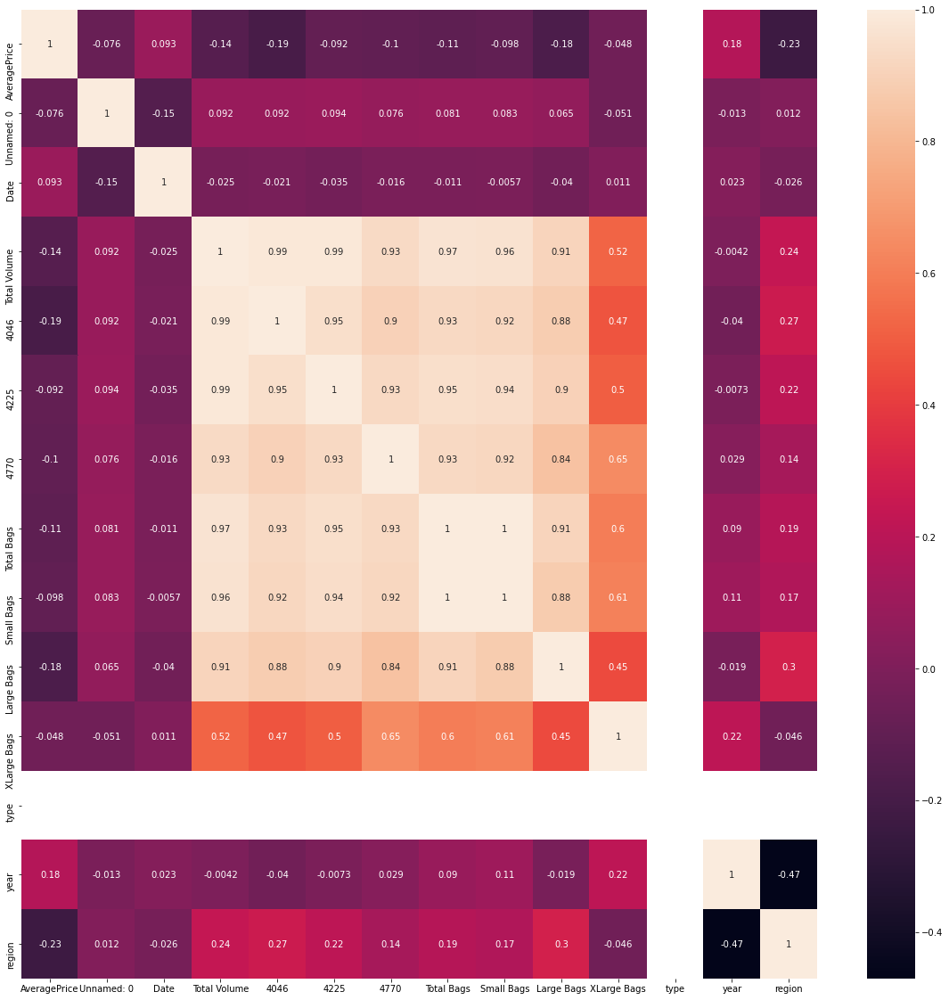

In [24]:
corr_matrix_hmap=data.corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr_matrix_hmap,annot=True)
plt.show()

Here we observed that mostly corelated with Average Price is year correlation

4046, Large Bags, Total Volume are highly negatively corelated

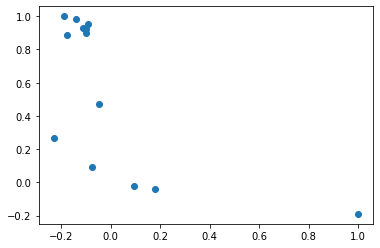

In [25]:
#RA
plt.scatter(corr_matrix_hmap['AveragePrice'],corr_matrix_hmap['4046'])
plt.show()

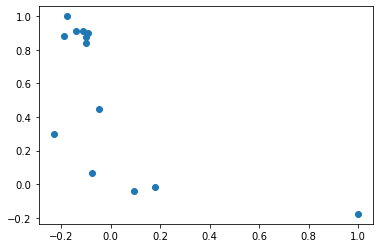

In [26]:
#RA
plt.scatter(corr_matrix_hmap['AveragePrice'],corr_matrix_hmap['Large Bags'])
plt.show()

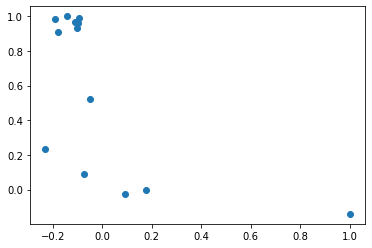

In [27]:
#RA
plt.scatter(corr_matrix_hmap['AveragePrice'],corr_matrix_hmap['Total Volume'])
plt.show()

In [28]:
corr_matrix_hmap["AveragePrice"].sort_values(ascending=False)

AveragePrice    1.000000
year            0.178683
Date            0.092984
XLarge Bags    -0.048284
Unnamed: 0     -0.075531
4225           -0.092084
Small Bags     -0.097682
4770           -0.100567
Total Bags     -0.111597
Total Volume   -0.140470
Large Bags     -0.177480
4046           -0.190096
region         -0.229408
type                 NaN
Name: AveragePrice, dtype: float64

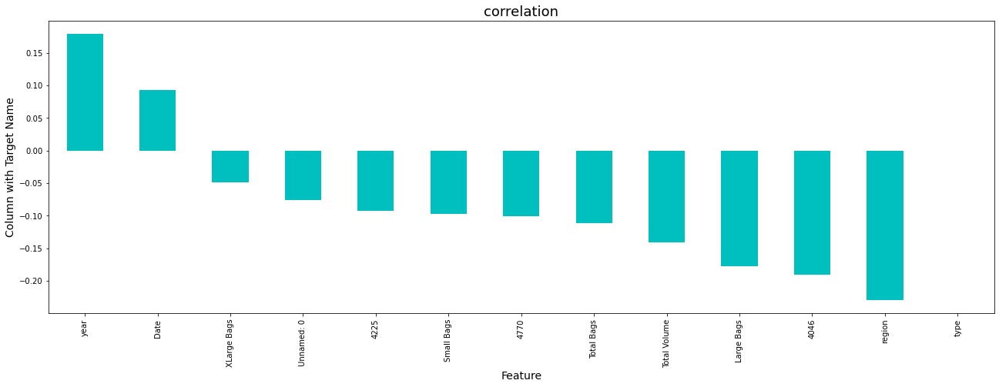

In [29]:
plt.figure(figsize=(22,7))
data.corr()['AveragePrice'].sort_values(ascending=False).drop(['AveragePrice']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Column with Target Name',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

### Observation: Year is highly correalted with Average Price

In [30]:
x = data.iloc[:,1:]
x.head()

,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0.0,92.0,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,0.0,2015.0,0.0
1,1.0,68.0,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,0.0,2015.0,0.0
2,2.0,44.0,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,0.0,2015.0,0.0
3,3.0,20.0,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,0.0,2015.0,0.0
4,4.0,98.0,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,0.0,2015.0,0.0


In [31]:
x.shape

(1517, 13)

### SKEWNESS

In [32]:
x.skew()

Unnamed: 0     -0.234824
Date            0.012623
Total Volume    6.200138
4046            6.051830
4225            6.394926
4770            5.405164
Total Bags      5.366378
Small Bags      5.355185
Large Bags      5.144495
XLarge Bags     5.775077
type            0.000000
year            1.828332
region          0.288146
dtype: float64

There is skewness present, so need to remove that

In [33]:
#Method for removing skew
from sklearn.preprocessing import power_transform
z = power_transform(x[:])
x= pd.DataFrame(z,columns=x.columns)

In [34]:
x

,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,-1.953012,1.278330,0.0,-1.757736,-0.545363,-1.675878,-2.030217,-1.847586,-1.072172,-0.885019,0.0,0.0,-1.828509
1,-1.855811,0.620175,0.0,-1.919557,-0.667814,-1.619934,-1.931468,-1.748426,-1.062461,-0.885019,0.0,0.0,-1.828509
2,-1.765244,-0.110050,0.0,-1.857996,-0.124940,-1.375858,-2.103934,-1.923541,-1.050081,-0.885019,0.0,0.0,-1.828509
3,-1.678732,-0.971502,0.0,-1.724410,-0.375219,-1.555093,-2.497084,-2.330946,-0.991861,-0.885019,0.0,0.0,-1.828509
4,-1.595115,1.434708,0.0,-1.794175,-0.679011,-1.542167,-2.422996,-2.267260,-0.900922,-0.885019,0.0,0.0,-1.828509
5,-1.513735,0.818198,0.0,-1.707263,-0.622099,-1.704522,-2.331445,-2.159322,-1.002838,-0.885019,0.0,0.0,-1.828509
6,-1.434170,0.112645,0.0,-1.652065,-0.361102,-1.479416,-2.080129,-1.902012,-1.012586,-0.885019,0.0,0.0,-1.828509
7,-1.356127,-0.699472,0.0,-1.903560,-0.166447,-1.525874,-2.306331,-2.212691,-0.636264,-0.885019,0.0,0.0,-1.828509
8,-1.279389,-1.803186,0.0,-1.763101,-0.258552,-1.506363,-1.735278,-1.568802,-0.812946,-0.885019,0.0,0.0,-1.828509
9,-1.203793,1.065158,0.0,-1.836083,-0.439446,-1.420535,-2.039389,-1.920833,-0.635272,-0.885019,0.0,0.0,-1.828509


In [35]:
x.skew()

Unnamed: 0     -0.348219
Date           -0.286196
Total Volume    0.000000
4046           -0.012059
4225            0.008450
4770           -0.032945
Total Bags      0.005205
Small Bags      0.027632
Large Bags     -0.074795
XLarge Bags     0.417289
type            0.000000
year            0.000000
region         -0.209568
dtype: float64

### OUTLIERS

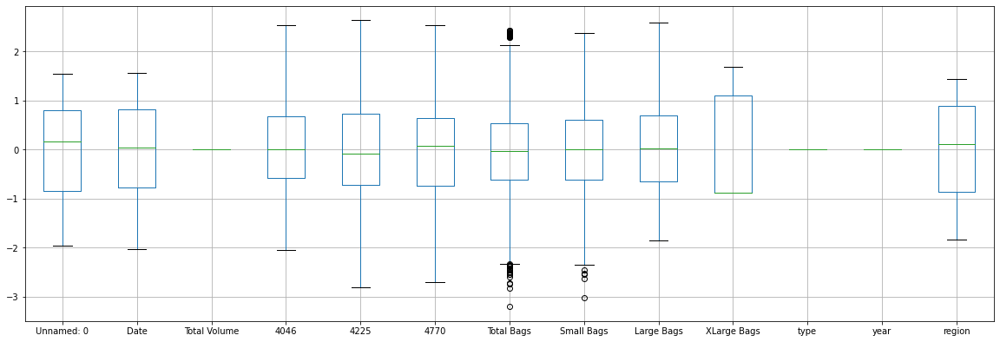

In [36]:
#checking for outliers
x.iloc[:,:].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

# Seprating Independent Variables and Dependent Variables

In [37]:
# x= independent variable
x.head()

,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,-1.953012,1.278330,0.0,-1.757736,-0.545363,-1.675878,-2.030217,-1.847586,-1.072172,-0.885019,0.0,0.0,-1.828509
1,-1.855811,0.620175,0.0,-1.919557,-0.667814,-1.619934,-1.931468,-1.748426,-1.062461,-0.885019,0.0,0.0,-1.828509
2,-1.765244,-0.110050,0.0,-1.857996,-0.124940,-1.375858,-2.103934,-1.923541,-1.050081,-0.885019,0.0,0.0,-1.828509
3,-1.678732,-0.971502,0.0,-1.724410,-0.375219,-1.555093,-2.497084,-2.330946,-0.991861,-0.885019,0.0,0.0,-1.828509
4,-1.595115,1.434708,0.0,-1.794175,-0.679011,-1.542167,-2.422996,-2.267260,-0.900922,-0.885019,0.0,0.0,-1.828509


In [38]:
#y = target variable , Average Price as column
y = data.iloc[:,0]
y.head()

0    1.33
1    1.35
2    0.93
3    1.08
4    1.28
Name: AveragePrice, dtype: float64

In [39]:
x.shape

(1517, 13)

In [40]:
y.shape

(1517,)

# Scaling

In [41]:
y

0       1.33
1       1.35
2       0.93
3       1.08
4       1.28
5       1.26
6       0.99
7       0.98
8       1.02
9       1.07
10      1.12
11      1.28
12      1.31
13      0.99
14      1.33
15      1.28
16      1.11
17      1.07
18      1.34
19      1.33
20      1.12
21      1.45
22      1.11
23      1.26
24      1.05
25      1.35
26      1.37
27      1.27
28      1.32
29      1.07
30      1.23
31      1.19
32      1.43
33      1.26
34      1.20
35      1.22
36      1.19
37      1.13
38      1.16
39      1.02
40      1.12
41      1.11
42      1.07
43      0.99
44      1.07
45      1.06
46      0.99
47      0.99
48      1.06
49      1.17
50      1.24
51      1.22
52      0.99
53      1.08
54      0.96
55      1.07
56      0.99
57      1.00
58      1.13
59      1.12
60      0.99
61      1.09
62      1.09
63      0.95
64      0.96
65      1.07
66      0.93
67      1.07
68      0.97
69      1.15
70      1.12
71      1.09
72      1.01
73      1.15
74      1.08
75      0.97
76      1.14

In [42]:
x.describe()

,Unnamed: 0,Date,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
count,1.517000e+03,1.517000e+03,1517.0,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1.517000e+03,1517.0,1517.0,1.517000e+03
mean,1.245616e-16,2.022114e-16,0.0,-2.685905e-17,-2.521238e-16,-4.484803e-16,3.990893e-16,-1.871425e-15,4.607023e-17,-4.427719e-16,0.0,0.0,-1.263181e-16
std,1.000330e+00,1.000330e+00,0.0,1.000330e+00,1.000330e+00,1.000330e+00,1.000330e+00,1.000330e+00,1.000330e+00,1.000330e+00,0.0,0.0,1.000330e+00
min,-1.953012e+00,-2.035716e+00,0.0,-2.055484e+00,-2.800219e+00,-2.700689e+00,-3.203621e+00,-3.015760e+00,-1.855884e+00,-8.850188e-01,0.0,0.0,-1.828509e+00
25%,-8.391747e-01,-7.749326e-01,0.0,-5.785169e-01,-7.133447e-01,-7.295863e-01,-6.119970e-01,-6.085145e-01,-6.467758e-01,-8.850188e-01,0.0,0.0,-8.606505e-01
50%,1.733819e-01,4.996290e-02,0.0,6.975933e-03,-7.522459e-02,7.635463e-02,-2.016144e-02,6.990110e-03,3.264704e-02,-8.850188e-01,0.0,0.0,1.153817e-01
75%,8.079032e-01,8.181985e-01,0.0,6.803949e-01,7.366570e-01,6.367528e-01,5.331063e-01,6.174399e-01,7.016907e-01,1.108704e+00,0.0,0.0,8.888321e-01
max,1.541758e+00,1.562919e+00,0.0,2.546469e+00,2.638162e+00,2.542237e+00,2.439445e+00,2.387448e+00,2.590958e+00,1.696257e+00,0.0,0.0,1.448732e+00


In [43]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)

In [44]:
x

array([[-1.95301161,  1.27833018,  0.        , ...,  0.        ,
         0.        , -1.82850904],
       [-1.85581139,  0.62017518,  0.        , ...,  0.        ,
         0.        , -1.82850904],
       [-1.76524389, -0.11004985,  0.        , ...,  0.        ,
         0.        , -1.82850904],
       ...,
       [-0.98268425, -1.67948678,  0.        , ...,  0.        ,
         0.        , -0.75962031],
       [-0.91058413,  1.0381087 ,  0.        , ...,  0.        ,
         0.        , -0.75962031],
       [-0.83917467,  0.35670103,  0.        , ...,  0.        ,
         0.        , -0.75962031]])

# Train-Test Split

In [45]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state = 42)

In [46]:
x_train.shape

(1016, 13)

In [47]:
y_train.shape

(1016,)

In [48]:
x_test.shape

(501, 13)

In [49]:
y_test.shape

(501,)

Training data: taken 1016 data as training, Testing data: taken 501 data as testing

# Model -> Linear Regression

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
lr=LinearRegression()


In [51]:
lr.fit(x_train,y_train)

LinearRegression()

In [52]:
lr.coef_

array([-4.85793234e-03,  8.82642387e-03, -4.16333634e-17, -1.15226849e-01,
       -1.29540429e-02, -2.52063665e-02, -2.53011564e-01,  2.85765537e-01,
        4.76913118e-02,  1.85615078e-02,  0.00000000e+00,  0.00000000e+00,
       -6.98949188e-03])

In [53]:
lr.intercept_

1.0728178067071368

In [54]:
lr.score(x_train,y_train)

0.3425474935460445

# Prediction

In [55]:
#predict the values
pred=lr.predict(x_test)
print("Predicted AveragePrice",pred)
print("Actual AveragePrice",y_test)

Predicted AveragePrice [1.17311793 1.25876632 0.98312635 0.99661808 1.20608927 0.98710698
 1.02839355 1.04116432 0.96076168 0.99740647 1.02923606 1.05761332
 1.18380452 0.91055682 1.04036699 1.19649455 1.14905581 1.01616627
 1.02900587 1.2726319  1.07118725 1.07879359 1.04311068 1.28400389
 1.13923135 0.87130782 1.07012192 0.97722572 1.12780265 0.98770934
 1.09427158 0.90478462 1.2515173  1.08487962 0.97102617 1.34292342
 1.24863611 0.92748867 1.0524804  1.00474749 1.01241754 1.25377552
 1.33162569 1.1081965  0.99208038 1.08705203 1.07752005 1.00327473
 1.10108344 1.11623628 1.15462806 1.05155689 1.12629123 1.16224226
 1.04263925 1.18104229 1.1291132  1.044737   1.03717164 1.09757187
 1.15943638 1.23996721 1.23537184 1.16187596 1.05346052 0.96817928
 0.89945371 1.10966791 0.99812648 0.95742761 1.16620173 0.93133558
 1.02915388 1.02322178 0.97360646 0.94881885 1.07557483 1.11750021
 1.04267214 0.9331465  1.01883984 0.96817343 1.16487135 0.93535942
 0.93210385 0.95817008 0.96994678 0.956

In [56]:
#Errors:

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

print('Mean Absolute Error:',mean_absolute_error(y_test,pred))

print('Mean Squared Error:',mean_squared_error(y_test,pred))

print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))

Mean Absolute Error: 0.1191483146491764
Mean Squared Error: 0.023559217405483914
Root Mean Squared Error: 0.15349012152410302


# R2 Error 

In [57]:
#coefficient of determination
#change in y whenever x i being changed
from sklearn.metrics import r2_score
print('r2 Score:',r2_score(y_test,pred))

r2 Score: 0.3205771753930303


Here we observed that with the change in X, =.32%  y is changed (variation is coming)

# Find Best Random State

In [58]:
from sklearn.linear_model import LinearRegression
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state = i)
    LR = LinearRegression()
    LR.fit(x_train,y_train)
    predrf = LR.predict(x_test)
    mse = r2_score(y_test,predrf)
    if mse > maxAccu:
        maxAccu = mse
        maxRS = i
        
print("Best score is: ",maxAccu,"on Random_state",maxRS)
    
    
    

Best score is:  0.3968115890714963 on Random_state 151


## Train-Test Model according to best random state value

In [59]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state = 151)

In [60]:
LR = LinearRegression()
LR.fit(x_train,y_train)
predrf = LR.predict(x_test)

In [61]:
print('r2 Score:',r2_score(y_test,predrf))

r2 Score: 0.3968115890714963


In [62]:
pred_train = LR.predict(x_train)
pred_test =LR.predict(x_test) 
Train_accuracy = r2_score(y_train,pred_train)
Test_accuracy = r2_score(y_test,pred_test)
maxAccu=0
maxRS=0

from sklearn.model_selection import cross_val_score
for j in range(2,16):
    cv_score=cross_val_score(LR,x,y,cv=j)
    cv_mean = cv_score.mean()
    if cv_mean > maxAccu:
        maxAccu = cv_mean
        maxRS = j
        
    
    
    print(f"At cross fold {j} cv score is {cv_mean} and accuracy score training is {Train_accuracy} and accuracy for the testing is {Test_accuracy}")
    print("\n")
    

At cross fold 2 cv score is -0.06976643820230827 and accuracy score training is 0.2991009813545359 and accuracy for the testing is 0.3968115890714963


At cross fold 3 cv score is 0.02921364904408826 and accuracy score training is 0.2991009813545359 and accuracy for the testing is 0.3968115890714963


At cross fold 4 cv score is 0.03733232092373895 and accuracy score training is 0.2991009813545359 and accuracy for the testing is 0.3968115890714963


At cross fold 5 cv score is 0.015641573992376978 and accuracy score training is 0.2991009813545359 and accuracy for the testing is 0.3968115890714963


At cross fold 6 cv score is -0.056824977718750315 and accuracy score training is 0.2991009813545359 and accuracy for the testing is 0.3968115890714963


At cross fold 7 cv score is 0.05833042034999018 and accuracy score training is 0.2991009813545359 and accuracy for the testing is 0.3968115890714963


At cross fold 8 cv score is -0.006043119936568572 and accuracy score training is 0.2991009

Text(0.5, 1.0, 'Linear Regression')

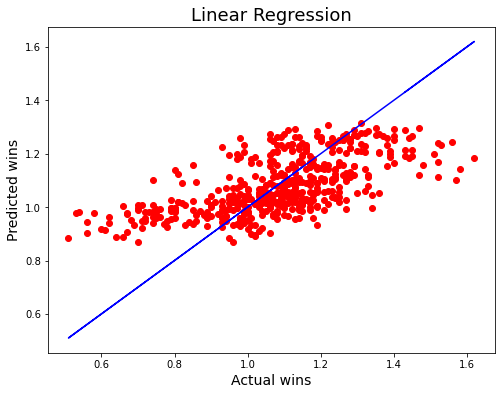

In [63]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y= pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual wins',fontsize=14)
plt.ylabel('Predicted wins',fontsize=14)
plt.title('Linear Regression',fontsize=18)

In [64]:
# Regularization

In [65]:
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')


In [66]:
#Lasso tries to ommit coefficient value (the value which dont affect y)
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
parameters = {'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'alpha': 0.0001, 'random_state': 0}


In [67]:
ls = Lasso(alpha=0.0001,random_state=0)
ls.fit(x_train,y_train)
ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)

lss=r2_score(y_test,pred_ls)
lss

0.395691368166727

In [68]:
#cross_validation_mean = cv_mean
#cross_validation_score= cv_score

cross_validation_score = cross_val_score(ls,x,y,cv=5)
cross_validation_mean = cross_validation_score.mean()
cross_validation_mean

0.017514913929318365

In [69]:
# Ensemble Technique

In [70]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
parameters = {'criterion':['mse','mae'],'max_features':["auto","sqrt","log2"]}

rf = RandomForestRegressor()
clf=GridSearchCV(rf,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'auto'}


In [71]:
rf=RandomForestRegressor(criterion="mse",max_features="log2")
rf.fit(x_train,y_train)
rf.score(x_train,y_train)
pred_decision=rf.predict(x_test)

rfs = r2_score(y_test,pred_decision)
print('R2 Score:',rfs*100)

rfscore=cross_val_score(rf,x,y,cv=5)
rfc=rfscore.mean()

print("Cross Validation Score:",rfc*100)



R2 Score: 83.05173890936304
Cross Validation Score: 22.82357977856852


R2 score with 83% accuracy

# Saving Model

In [72]:
import pickle
filename = "Avocado.pkl"
pickle.dump(rf,open(filename,"wb"))


In [73]:
# Conclusion


In [75]:
loaded_model=pickle.load(open('Avocado.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result)

0.8305173890936304


In [76]:
conclusion = pd.DataFrame([loaded_model.predict(x_test)[:],pred_decision[:]],index=["Predicted","Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,491,492,493,494,495,496,497,498,499,500
Predicted,1.1193,1.0505,1.1087,1.2956,1.1352,1.1767,1.1107,0.9701,0.6735,1.0567,...,1.083,1.0717,1.0118,1.2066,1.2201,1.1936,1.1338,1.0372,0.6138,1.1706
Original,1.1193,1.0505,1.1087,1.2956,1.1352,1.1767,1.1107,0.9701,0.6735,1.0567,...,1.083,1.0717,1.0118,1.2066,1.2201,1.1936,1.1338,1.0372,0.6138,1.1706
